# Introduction to Audio Data

## Overview

Audio data, by nature, is a continuous signal represented by an infinite number of values over time. To process, store, and transmit audio using digital devices, this continuous sound wave is converted into a series of discrete values, forming a digital representation. Different file formats like .wav, .flac, and .mp3 compress this representation in various ways.

## Sampling and Sampling Rate

- **Sampling:** The process of measuring the value of a continuous signal at fixed time steps.
- **Sampling Rate:** The number of samples taken per second, measured in hertz (Hz).

   - CD-quality audio: 44,100 Hz
   - High-resolution audio: 192,000 Hz

- **Nyquist Limit:** Half the sampling rate, determining the highest frequency captured.

   - Audible frequencies in human speech are below 8 kHz.

- **Uniform Sampling Rate:** Important for model generalization in audio tasks.

## Amplitude and Bit Depth

- **Amplitude:** Describes the sound pressure level, measured in decibels (dB).

   - Human speech is typically below 60 dB, while a rock concert can reach 125 dB.

- **Bit Depth:** Determines the precision of amplitude representation.

   - Common bit depths: 16-bit, 24-bit (higher bit depth reduces quantization noise).

- **32-bit Audio:** Stores samples as floating-point values, beneficial for machine learning.

   - Conversion to floating-point is required before training models.

- **Decibel Scale:** Logarithmic representation for human hearing sensitivity.

## Audio as a Waveform

- **Waveform:** Visualizes sample values over time, showing amplitude changes.

   - Librosa library helps plot waveforms in Python.

- **Visualization Utility:** Useful for identifying timing, loudness, and irregularities in audio.

## Frequency Spectrum

- **Frequency Spectrum:** Illustrates frequencies and their amplitudes in an audio signal.

   - Calculated using Discrete Fourier Transform (DFT).

   - Librosa library aids in plotting frequency spectra.

- **FFT vs. DFT:** FFT (Fast Fourier Transform) is commonly used due to computational efficiency.

- **DFT Steps:**
   1. **A/D Conversion:** Convert analog signal to digital format.
   2. **Preemphasis:** Boost energy in higher frequencies.
   3. **Windowing:** Divide signal into segments, using Hamming/Hanning windows.
   4. **DFT:** Transform signal from time domain to frequency domain.

## Spectrogram

- **Spectrogram:** Captures frequency content changes over time, computed using Short Time Fourier Transform (STFT).

   - Powerful for visualizing music instruments, vocal tracks, and speech features.

   - STFT segmentation provides time and frequency information.

- **Spectrogram Visualization:** Plots amplitude or power of frequency components.

   - Librosa library facilitates spectrogram creation.

## Mel Spectrogram

- **Mel Spectrogram:** Variant emphasizing human auditory system perception.

   - Uses mel filterbank to transform frequencies to mel scale.

   - Popular in speech processing, music analysis, and machine learning tasks.

   - Librosa library supports mel spectrogram plotting.

Understanding audio data through visualizations like waveforms, frequency spectra, spectrograms, and mel spectrograms is essential for effective analysis and processing.

## Speech Recognition and Feature Extraction using MFCC

### Speech Recognition

Speech Recognition is a supervised learning task where the goal is to predict text from an audio signal. To address the challenge of noise in raw audio signals, feature extraction techniques are employed for improved performance. One widely used technique is Mel-frequency cepstral coefficients (MFCC).

### Mel-frequency cepstral coefficients (MFCC)

MFCC is a feature extraction technique extensively used in speech and audio processing. It represents the spectral characteristics of sound, making it suitable for various machine learning tasks like speech recognition and music analysis.

In simpler terms, MFCCs are coefficients capturing the shape of the power spectrum of a sound signal. The process involves transforming the raw audio signal into the frequency domain using techniques like Discrete Fourier Transform (DFT) and applying the mel-scale to approximate human auditory perception. Cepstral coefficients are then computed from the mel-scaled spectrum.

MFCCs prove valuable as they emphasize features crucial for human speech perception while discarding less relevant information. This makes them effective for tasks such as speaker recognition, emotion detection, and speech-to-text conversion.

## Roadmap of the MFCC Technique

### 1. A/D Conversion:

Convert audio signal from analog to digital format with a sampling frequency of 8 kHz or 16 kHz.

### 2. Preemphasis:

Increase the magnitude of energy in higher frequencies to improve phone detection accuracy.

### 3. Windowing:

Break the audio signal into segments with each segment having 25ms width and signal at 10ms apart using Hamming/Hanning windows.

### 4. DFT (Discrete Fourier Transform):

Convert the signal from the time domain to the frequency domain.

### 5. Mel-Filter Bank:

Map actual frequency to the frequency perceived by

 humans using mel filters.

### 6. Logarithm:

Compute the logarithm of the powers obtained from mel filter banks.

### 7. DCT (Discrete Cosine Transform):

Extract significant features from the log filter bank energies to get the cepstral coefficients.

### 8. MFCCs:

Select a subset of the cepstral coefficients to form the final MFCCs.

The MFCC technique is a cornerstone in speech processing, contributing significantly to the success of various applications like voice assistants, transcription services, and more. Understanding the roadmap of MFCC extraction provides insight into its role in converting raw audio signals into informative features for machine learning models.

In [601]:
! pip install --upgrade librosa matplotlib


In [575]:
pip install soundfile


In [ ]:
! pip install xgboost


In [ ]:
! pip install librosa

In [ ]:
! pip install --upgrade matplotlib


In [573]:
import os
import librosa
import librosa.display
import matplotlib.pyplot as plt
import seaborn as sns
import IPython.display as ipd
import numpy as np
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import InputLayer, Conv2D, MaxPooling2D, Dense, Flatten
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint


In [ ]:
import os
import librosa
import librosa.display
import matplotlib.pyplot as plt
import seaborn as sns
import IPython.display as ipd
import numpy as np

# Function to plot mel spectrogram and spectrogram
def plot_spectrogram(file_path, is_dysarthria, gender):
    # Load audio file
    y, sr = librosa.load(file_path,sr=16000)

    # Plot mel spectrogram
    plt.figure(figsize=(10, 6))
    mel_spec = librosa.feature.melspectrogram(y=y, sr=sr)
    librosa.display.specshow(librosa.power_to_db(mel_spec, ref=np.max), y_axis='mel', x_axis='time')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Mel Spectrogram - {is_dysarthria.capitalize()} {gender}')
    plt.xlabel('Time (s)')
    plt.ylabel('Mel Frequency')
    plt.show()

    # Plot spectrogram
    plt.figure(figsize=(10, 6))
    spec = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)
    librosa.display.specshow(spec, y_axis='log', x_axis='time')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Spectrogram - {is_dysarthria.capitalize()} {gender}')
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')
    plt.show()

    # Play audio
    print(f'Playing {is_dysarthria} {gender} audio...')
    ipd.display(ipd.Audio(data=y, rate=sr))

# Set the path to the local dataset folder
local_dataset_folder = 'D:/Downloads/archive (3)/torgo_data'

# Specify examples to plot and play
examples_to_plot = [
    ('dysarthria_male', 'male'),
    ('non_dysarthria_male', 'male'),
    ('dysarthria_female', 'female'),
    ('non_dysarthria_female', 'female')
]

# Loop through specified examples and plot spectrograms
for folder, gender in examples_to_plot:
    example_file = os.listdir(os.path.join(local_dataset_folder, folder))[0]
    file_path = os.path.join(local_dataset_folder, folder, example_file)
    is_dysarthria = "non-dysarthria" if "non" in folder else "dysarthria"
    plot_spectrogram(file_path, is_dysarthria, gender)


# 1. making the Dataframe With correct Path
 * Checking if data us balanced or not
 * Checking if there is Null values
 * Ploting diffrent Plots Related to Audio

In [604]:
import pandas as pd
directory = 'D:/Downloads/archive (6)'
df = pd.read_csv("D:/Downloads/archive (6)/torgo_data/data.csv")
df['filename'] = df['filename'].apply(lambda x: os.path.join(directory,x))



In [605]:
# Check for missing values in the dataset
missing_values = df.isnull().sum()

# Display missing values information
print("Missing Values:")
print(missing_values)
print()
df = df.dropna()    # Drop missing values
df = df.reset_index(drop=True)    # Reset index
df.head()


Missing Values:
is_dysarthria    0
gender           0
filename         0
dtype: int64



,is_dysarthria,gender,filename
0,non_dysarthria,female,D:/Downloads/archive (6)\torgo_data/non_dysart...
1,non_dysarthria,female,D:/Downloads/archive (6)\torgo_data/non_dysart...
2,non_dysarthria,female,D:/Downloads/archive (6)\torgo_data/non_dysart...
3,non_dysarthria,female,D:/Downloads/archive (6)\torgo_data/non_dysart...
4,non_dysarthria,female,D:/Downloads/archive (6)\torgo_data/non_dysart...


In [606]:
import librosa

# Replace 'your_audio_file.wav' with the actual path to your audio file
audio_file_path = df['filename'].iloc[0]

# Load the audio file
y, sr = librosa.load(audio_file_path, sr=None)

# Print the sampling rate
print(f'Sampling rate: {sr} Hz')


Sampling rate: 16000 Hz


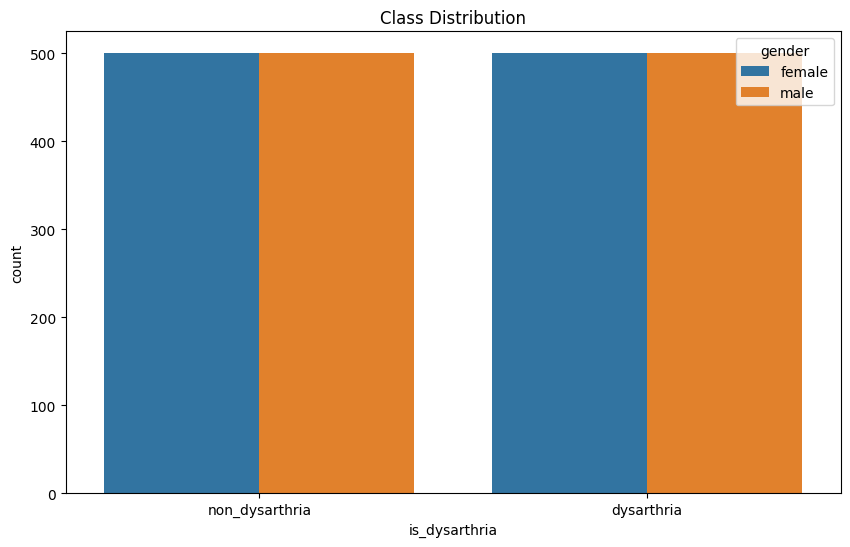

In [607]:
import seaborn as sns
import matplotlib.pyplot as plt

# Visualize the distribution of classes
plt.figure(figsize=(10, 6))
sns.countplot(x='is_dysarthria', hue='gender', data=df)
plt.title('Class Distribution')
plt.show()


In [609]:
import librosa

# Function to extract audio features
def extract_features(file_path):
    y, sr = librosa.load(file_path)
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=128)
    chroma = librosa.feature.chroma_stft(y=y, sr=sr)
    spectral_contrast = librosa.feature.spectral_contrast(y=y, sr=sr)
    return mfccs, chroma, spectral_contrast

# Get the file path for the first file in the DataFrame
first_file_path = df['filename'].iloc[1000]

# Extract features for the first file
mfccs, chroma, spectral_contrast = extract_features(first_file_path)

gender = df['gender'].iloc[1000]
dysarthria_status = df['is_dysarthria'].iloc[1000]

# Display shapes of extracted features
print(f"MFCCs shape: {mfccs.shape}")
print(f"Chroma shape: {chroma.shape}")
print(f"Spectral Contrast shape: {spectral_contrast.shape}")


MFCCs shape: (20, 246)
Chroma shape: (12, 246)
Spectral Contrast shape: (7, 246)


In [610]:
df.sample(frac=1).reset_index(drop=True,inplace=True)
male_dysarthric = df[(df['gender']=='male') & (df['is_dysarthria']=='dysarthria')].sample(100)
female_dysarthric = df[(df['gender']=='female') & (df['is_dysarthria']=='dysarthria')].sample(100)
male_ndysarthric = df[(df['gender']=='male') & (df['is_dysarthria']=='non_dysarthria')].sample(100)
female_ndysarthric = df[(df['gender']=='female') & (df['is_dysarthria']=='non_dysarthria')].sample(100)

In [611]:
male_dysarthric.iloc[0]["filename"]

'D:/Downloads/archive (6)\\torgo_data/dysarthria_male/M05_Session2_0166.wav'

In [612]:
import os
import librosa
import pandas as pd
import soundfile as sf

def add_noise_to_audio(audio, noise_level=0.01):  # Increased noise level
    noise = np.random.randn(len(audio))
    augmented_audio = audio + noise_level * noise
    return augmented_audio

# Assuming 'df' is your original DataFrame

print(f"Original df size: {df.shape[0]}")  # Check initial size of the original DataFrame

# Create a copy to work with the noisy samples
noisy_df = df.copy()

# Randomly select 600 samples for augmentation
indices = np.random.choice(noisy_df.shape[0], size=600, replace=False)
print(f"Number of unique indices selected for noise addition: {len(set(indices))}")  # Should be 600

noisy_samples = noisy_df.iloc[indices]

# Apply noise to each selected sample and update the DataFrame
for index in indices:
    row = noisy_df.loc[index]
    audio, sr = librosa.load(row['filename'], sr=None)
    noisy_audio = add_noise_to_audio(audio)
    
    # Construct the noisy filename
    file_path, file_extension = os.path.splitext(row['filename'])
    noisy_filename = f"{file_path}_noisy{file_extension}"
    
    # Save the noisy audio in the same directory as the original sample
    sf.write(noisy_filename, noisy_audio, sr)
    
    # Update the DataFrame with the noisy filename
    noisy_df.loc[index, 'filename'] = noisy_filename

print(f"Noisy df size before concatenation: {noisy_df.shape[0]}")  # Check size of the noisy DataFrame

# Concatenate the original samples with only the modified noisy samples
augmented_df = pd.concat([df, noisy_df.iloc[indices]])

print(f"Augmented df size after adding noisy samples: {augmented_df.shape[0]}")  # Should be 2600 now

# Reset index to avoid any duplicates from the concatenation
augmented_df = augmented_df.reset_index(drop=True)



Original df size: 2000
Number of unique indices selected for noise addition: 600
Noisy df size before concatenation: 2000
Augmented df size after adding noisy samples: 2600


In [597]:
noisy_files = augmented_df[augmented_df['filename'].str.contains('_noisy')]
noisy_files.iloc[0]["filename"]

'D:/Downloads/archive (3)\\torgo_data/non_dysarthria_male/MC03_Session1_0210_noisy.wav'

In [613]:
import IPython.display as ipd

# Randomly select a few indices from the noisy samples
sample_indices = np.random.choice(indices, size=5, replace=False)

for index in sample_indices:
    original_audio, sr = librosa.load(df.loc[index, 'filename'], sr=None)
    noisy_audio, sr = librosa.load(noisy_df.loc[index, 'filename'], sr=None)
    
    print(f"Playing original audio for index {index}:")
    ipd.display(ipd.Audio(data=original_audio, rate=sr))
    
    print(f"Playing noisy audio for index {index}:")
    ipd.display(ipd.Audio(data=noisy_audio, rate=sr))


Playing original audio for index 868:


Playing noisy audio for index 868:


Playing original audio for index 1135:


Playing noisy audio for index 1135:


Playing original audio for index 701:


Playing noisy audio for index 701:


Playing original audio for index 23:


Playing noisy audio for index 23:


Playing original audio for index 727:


Playing noisy audio for index 727:


Waveforms for index 61:


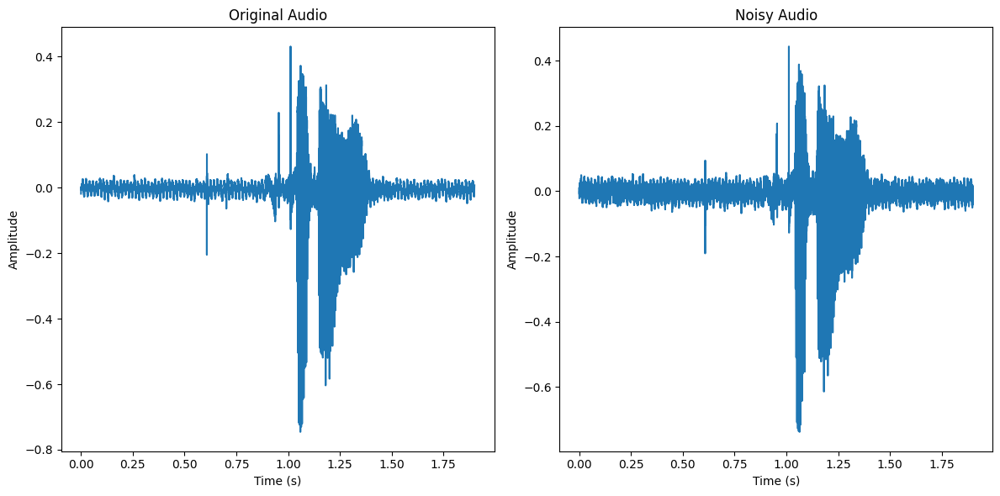

Waveforms for index 81:


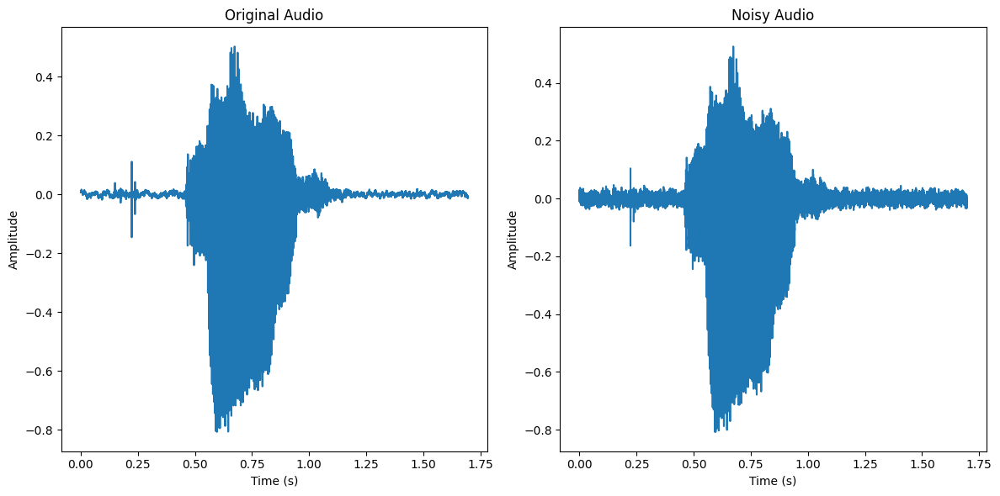

Waveforms for index 1806:


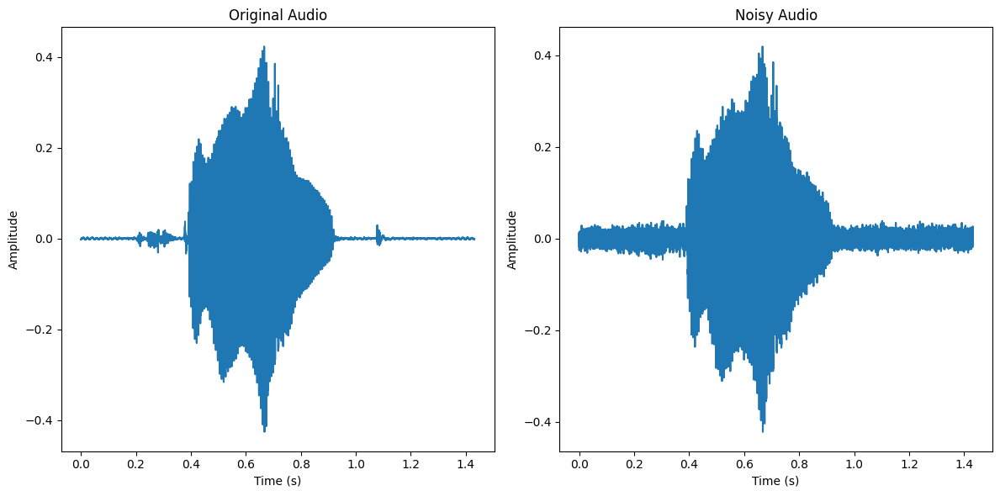

In [614]:
import matplotlib.pyplot as plt
import librosa.display
import numpy as np

def plot_waveforms(original_audio, noisy_audio, sr):
    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 2, 1)
    plt.plot(np.linspace(0, len(original_audio) / sr, num=len(original_audio)), original_audio)
    plt.title('Original Audio')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')

    plt.subplot(1, 2, 2)
    plt.plot(np.linspace(0, len(noisy_audio) / sr, num=len(noisy_audio)), noisy_audio)
    plt.title('Noisy Audio')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')

    plt.tight_layout()
    plt.show()


# Select exactly 3 random indices from the indices of noisy samples
sample_indices = np.random.choice(indices, size=3, replace=False)

for index in sample_indices:
    original_audio, sr = librosa.load(df.loc[index, 'filename'], sr=None)
    noisy_audio, sr = librosa.load(noisy_df.loc[index, 'filename'], sr=None)
    
    print(f"Waveforms for index {index}:")
    plot_waveforms(original_audio, noisy_audio, sr)


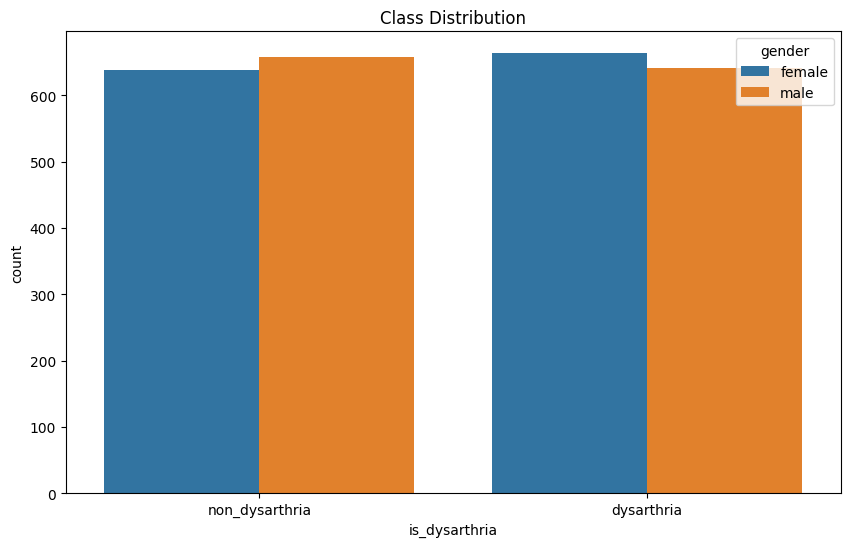

In [616]:
import seaborn as sns
import matplotlib.pyplot as plt

# Visualize the distribution of classes
plt.figure(figsize=(10, 6))
sns.countplot(x='is_dysarthria', hue='gender', data=augmented_df)
plt.title('Class Distribution')
plt.show()


Waveforms for index 61:


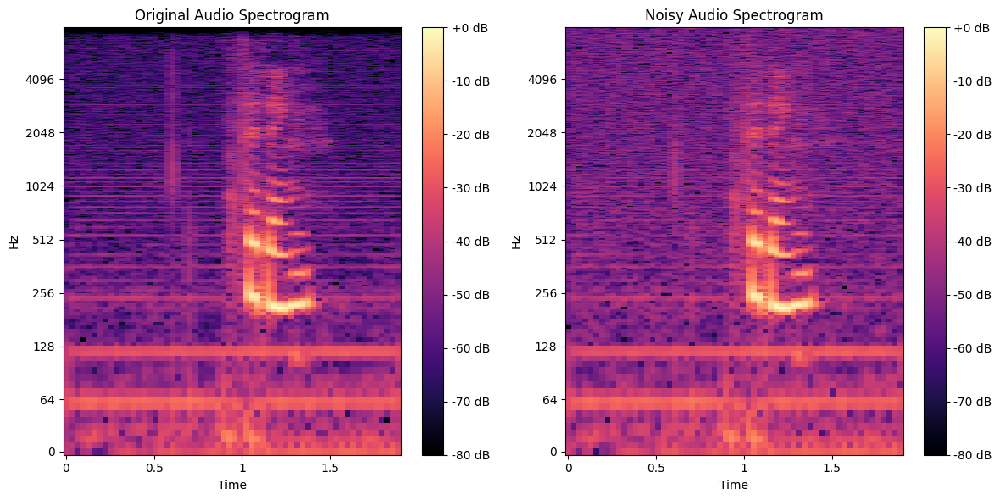

Waveforms for index 81:


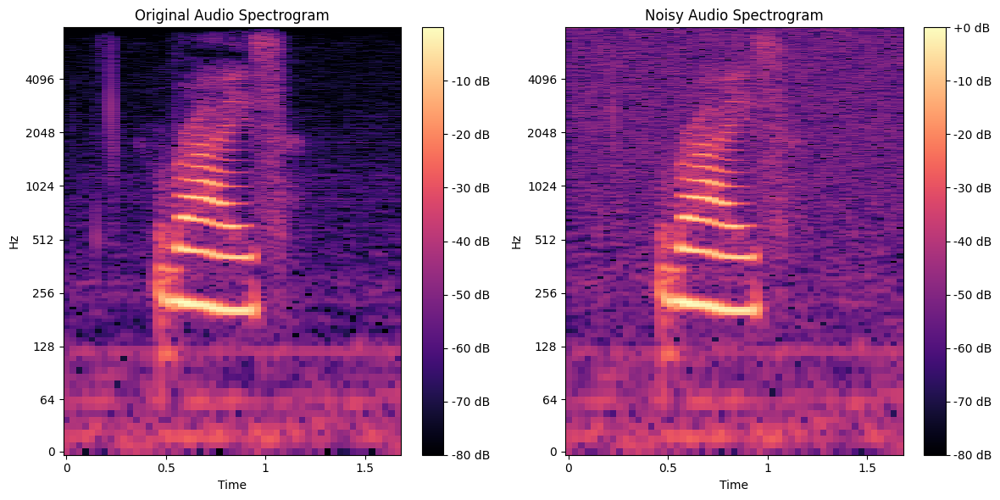

Waveforms for index 1806:


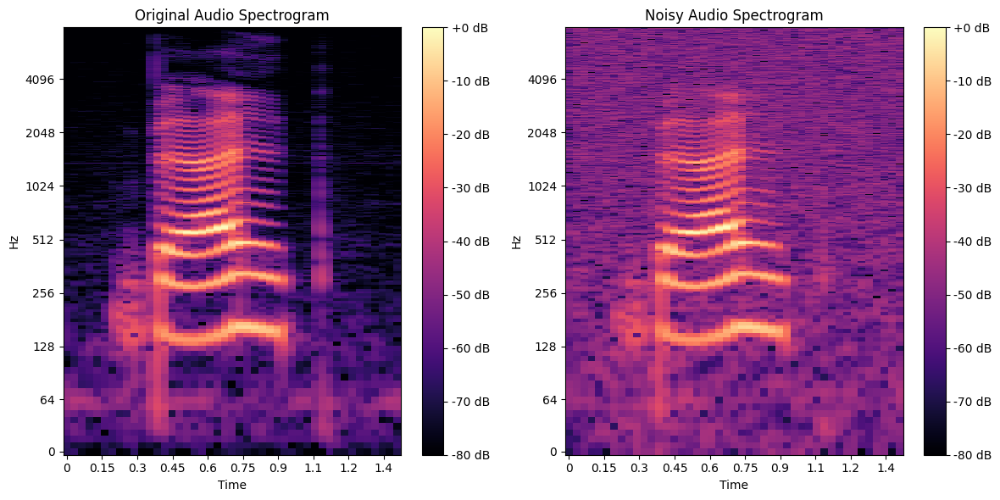

In [615]:
def plot_spectrograms(original_audio, noisy_audio, sr):
    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 2, 1)
    S_orig = librosa.amplitude_to_db(np.abs(librosa.stft(original_audio)), ref=np.max)
    librosa.display.specshow(S_orig, sr=sr, x_axis='time', y_axis='log')
    plt.title('Original Audio Spectrogram')
    plt.colorbar(format='%+2.0f dB')

    plt.subplot(1, 2, 2)
    S_noisy = librosa.amplitude_to_db(np.abs(librosa.stft(noisy_audio)), ref=np.max)
    librosa.display.specshow(S_noisy, sr=sr, x_axis='time', y_axis='log')
    plt.title('Noisy Audio Spectrogram')
    plt.colorbar(format='%+2.0f dB')

    plt.tight_layout()
    plt.show()
# Select exactly 3 random indices from the indices of noisy samples

for index in sample_indices:
    original_audio, sr = librosa.load(df.loc[index, 'filename'], sr=None)
    noisy_audio, sr = librosa.load(noisy_df.loc[index, 'filename'], sr=None)
    
    print(f"Waveforms for index {index}:")
    plot_spectrograms(original_audio, noisy_audio, sr)

In [646]:
augmented_df

,is_dysarthria,gender,filename
0,non_dysarthria,female,D:/Downloads/archive (6)\torgo_data/non_dysart...
1,non_dysarthria,female,D:/Downloads/archive (6)\torgo_data/non_dysart...
2,non_dysarthria,female,D:/Downloads/archive (6)\torgo_data/non_dysart...
3,non_dysarthria,female,D:/Downloads/archive (6)\torgo_data/non_dysart...
4,non_dysarthria,female,D:/Downloads/archive (6)\torgo_data/non_dysart...
...,...,...,...
2595,dysarthria,male,D:/Downloads/archive (6)\torgo_data/dysarthria...
2596,dysarthria,female,D:/Downloads/archive (6)\torgo_data/dysarthria...
2597,non_dysarthria,female,D:/Downloads/archive (6)\torgo_data/non_dysart...
2598,dysarthria,male,D:/Downloads/archive (6)\torgo_data/dysarthria...


In [444]:
df 

,is_dysarthria,gender,filename
0,non_dysarthria,female,D:/Downloads/archive (3)\torgo_data/non_dysart...
1,non_dysarthria,female,D:/Downloads/archive (3)\torgo_data/non_dysart...
2,non_dysarthria,female,D:/Downloads/archive (3)\torgo_data/non_dysart...
3,non_dysarthria,female,D:/Downloads/archive (3)\torgo_data/non_dysart...
4,non_dysarthria,female,D:/Downloads/archive (3)\torgo_data/non_dysart...
...,...,...,...
1995,dysarthria,male,D:/Downloads/archive (3)\torgo_data/dysarthria...
1996,dysarthria,male,D:/Downloads/archive (3)\torgo_data/dysarthria...
1997,dysarthria,male,D:/Downloads/archive (3)\torgo_data/dysarthria...
1998,dysarthria,male,D:/Downloads/archive (3)\torgo_data/dysarthria...


## 2. Plots
* Waveplots
* Spectogram
* Mel-Spectogram
* MFCC

D:/Downloads/archive (3)\torgo_data/dysarthria_male/M01_Session2_3_0106.wav
D:/Downloads/archive (3)\torgo_data/non_dysarthria_male/MC01_Session3_0313.wav
D:/Downloads/archive (3)\torgo_data/dysarthria_female/F03_Session3_0049.wav
D:/Downloads/archive (3)\torgo_data/non_dysarthria_female/FC02_Session3_0208.wav


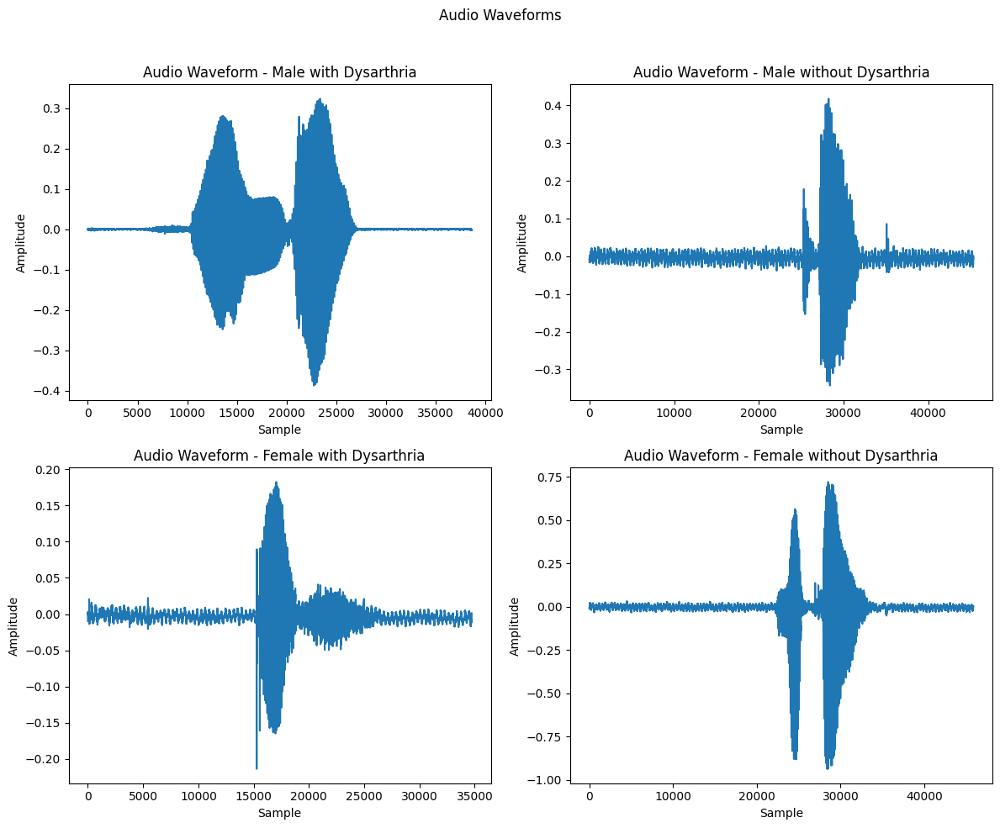

In [534]:
import matplotlib.pyplot as plt
import librosa

# Function to plot waveform
def plot_waveform(file_path, title, ax):
    # Load audio file
    y, sr = librosa.load(file_path)

    # Plot waveform
    ax.plot(y)
    ax.set_title(f'Audio Waveform - {title}')
    ax.set_xlabel('Sample')
    ax.set_ylabel('Amplitude')

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('Audio Waveforms')

# Loop through examples and plot waveform
for (example_df, title), ax in zip([(male_dysarthric, 'Male with Dysarthria'),
                                    (male_ndysarthric, 'Male without Dysarthria'),
                                    (female_dysarthric, 'Female with Dysarthria'),
                                    (female_ndysarthric, 'Female without Dysarthria')],
                                   axes.flatten()):
    file_path = example_df['filename'].values[50]
    print(file_path)
    plot_waveform(file_path, title, ax)

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Show the plot
plt.show()


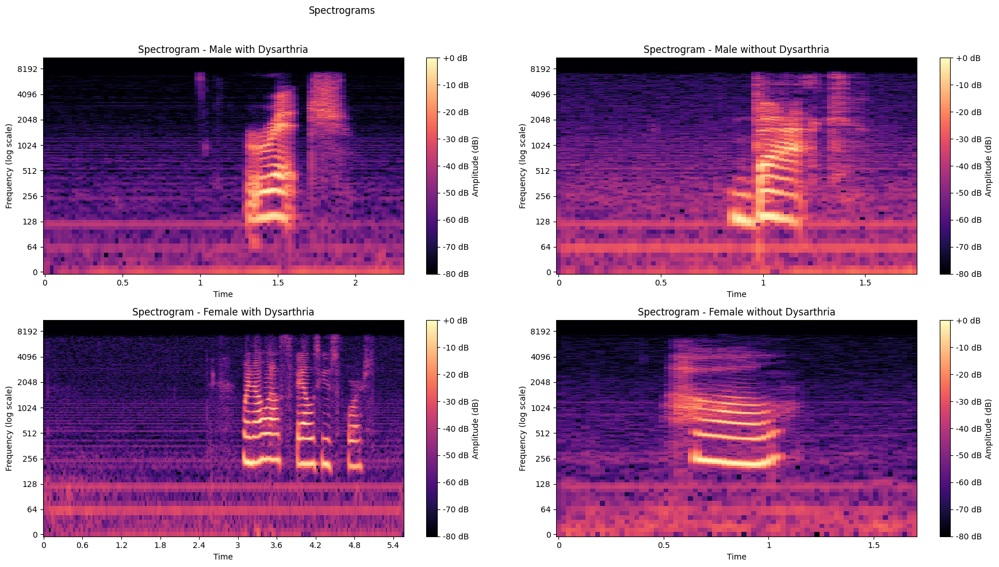

In [657]:
import matplotlib.pyplot as plt
import librosa
import librosa.display
import numpy as np

# Function to plot spectrogram
def plot_spectrogram(file_path, title, ax):
    # Load audio file
    y, sr = librosa.load(file_path)

    # Compute spectrogram
    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)

    # Plot spectrogram
    img = librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log', ax=ax)
    ax.set_title(f'Spectrogram - {title}')
    ax.set_xlabel('Time')
    ax.set_ylabel('Frequency (log scale)')

    # Add colorbar
    cbar = plt.colorbar(img, ax=ax, format='%+2.0f dB')
    cbar.set_label('Amplitude (dB)')

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('Spectrograms')

# Loop through examples and plot spectrogram
for (example_df, title), ax in zip([(male_dysarthric, 'Male with Dysarthria'),
                                    (male_ndysarthric, 'Male without Dysarthria'),
                                    (female_dysarthric, 'Female with Dysarthria'),
                                    (female_ndysarthric, 'Female without Dysarthria')],
                                   axes.flatten()):
    file_path = example_df['filename'].values[50]
    plot_spectrogram(file_path, title, ax)

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1.5, 0.96])

# Show the plot
plt.show()


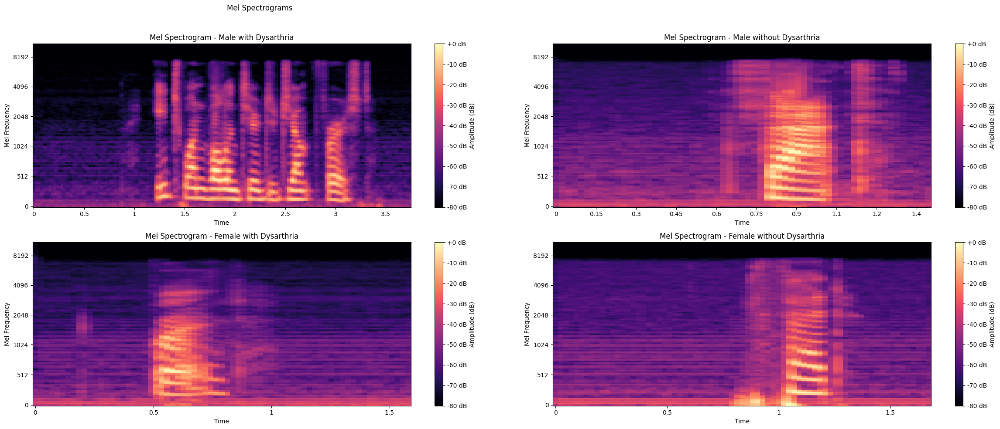

In [345]:
import matplotlib.pyplot as plt
import librosa.display
import numpy as np

# Function to plot Mel spectrogram
def plot_mel_spectrogram(file_path, title, ax):
    # Load audio file
    y, sr = librosa.load(file_path)

    # Compute Mel spectrogram
    mel_spec = librosa.feature.melspectrogram(y=y, sr=sr)

    # Convert to dB scale
    mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)

    # Plot Mel spectrogram
    img = librosa.display.specshow(mel_spec_db, sr=sr, x_axis='time', y_axis='mel', ax=ax)
    ax.set_title(f'Mel Spectrogram - {title}')
    ax.set_xlabel('Time')
    ax.set_ylabel('Mel Frequency')

    # Add colorbar
    cbar = plt.colorbar(mappable=img, ax=ax, format='%+2.0f dB')
    cbar.set_label('Amplitude (dB)')

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('Mel Spectrograms')

# Loop through examples and plot Mel spectrogram
for (example_df, title), ax in zip([(male_dysarthric, 'Male with Dysarthria'),
                                    (male_ndysarthric, 'Male without Dysarthria'),
                                    (female_dysarthric, 'Female with Dysarthria'),
                                    (female_ndysarthric, 'Female without Dysarthria')],
                                   axes.flatten()):
    file_path = example_df['filename'].values[1]
    plot_mel_spectrogram(file_path, title, ax)

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 2, 0.96])

# Show the plot
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import librosa.display

# Function to plot MFCC
def plot_mfcc(file_path, title, ax):
    y, sr = librosa.load(file_path, sr=None)
    mfccs = librosa.feature.mfcc(y=y, sr=sr)

    # Plot MFCC
    librosa.display.specshow(mfccs, x_axis='time', ax=ax)
    ax.set_title(title)
    ax.set_xlabel('Time')
    ax.set_ylabel('MFCC')

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('MFCCs')

# Plot MFCC for each sample
plot_mfcc(male_dysarthric['filename'].iloc[2], 'Male Dysarthric MFCC', axes[0, 0])
plot_mfcc(female_dysarthric['filename'].iloc[2], 'Female Dysarthric MFCC', axes[0, 1])
plot_mfcc(male_ndysarthric['filename'].iloc[2], 'Male Non-Dysarthric MFCC', axes[1, 0])
plot_mfcc(female_ndysarthric['filename'].iloc[2], 'Female Non-Dysarthric MFCC', axes[1, 1])

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0,1.5, 0.96])

# Show the plot
plt.show()


In [ ]:
import pandas as pd
import librosa
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm



# Function to extract MFCCs from a single file
def extract_mfcc(file_path):
    try:
        x, sr = librosa.load(file_path, sr=None)
        mfccs = librosa.feature.mfcc(y=x, sr=sr, n_mfcc=39)
        mean_mfccs = np.mean(mfccs, axis=1)
        return mean_mfccs
    except EOFError as e:
        print(f"Error processing {file_path}: {e}")
        return None

# Define the subsets for each category
male_dysarthric = df[(df['is_dysarthria'] == 'dysarthria') & (df['gender'] == 'male')]
male_nondysarthric = df[(df['is_dysarthria'] == 'non_dysarthria') & (df['gender'] == 'male')]
female_dysarthric = df[(df['is_dysarthria'] == 'dysarthria') & (df['gender'] == 'female')]
female_nondysarthric = df[(df['is_dysarthria'] == 'non_dysarthria') & (df['gender'] == 'female')]

# Extract MFCCs for one example from each subset
examples = {
    'Male with Dysarthria': extract_mfcc(male_dysarthric.iloc[1]['filename']),
    'Male without Dysarthria': extract_mfcc(male_nondysarthric.iloc[1]['filename']),
    'Female with Dysarthria': extract_mfcc(female_dysarthric.iloc[1]['filename']),
    'Female without Dysarthria': extract_mfcc(female_nondysarthric.iloc[1]['filename'])
}

# Plot the MFCCs
fig, axs = plt.subplots(4, 1, figsize=(10, 8))
fig.suptitle(' MFCCs for Each Category')

for ax, (label, mfccs) in zip(axs, examples.items()):
    if mfccs is not None:
        ax.plot(mfccs)
        ax.set_title(label)
        ax.set_xlabel('MFCC Coefficients')
        ax.set_ylabel('Amplitude')

plt.tight_layout()
plt.show()


In [348]:
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, recall_score

# 3. Feature Extraction

In [655]:
def feature_extraction(df):
    features = []
    for i,record in tqdm(df.iterrows(),total=df.shape[0]):
        try:
            x , sr = librosa.load(record['filename'],sr=None)
            mean_mfcc = np.mean(librosa.feature.mfcc(y=x, sr=sr, n_mfcc=39),axis=1)
            features.append(mean_mfcc)
        except EOFError:
            pass
        
    dataf = pd.DataFrame(features)
    dataf['Gender']= df['gender']
    dataf['class'] = df['is_dysarthria']
    return dataf

In [656]:
dataf = feature_extraction(augmented_df)

 23%|██▎       | 593/2600 [00:06<00:21, 91.25it/s] PySoundFile failed. Trying audioread instead.
librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
100%|██████████| 2600/2600 [00:30<00:00, 84.53it/s] 


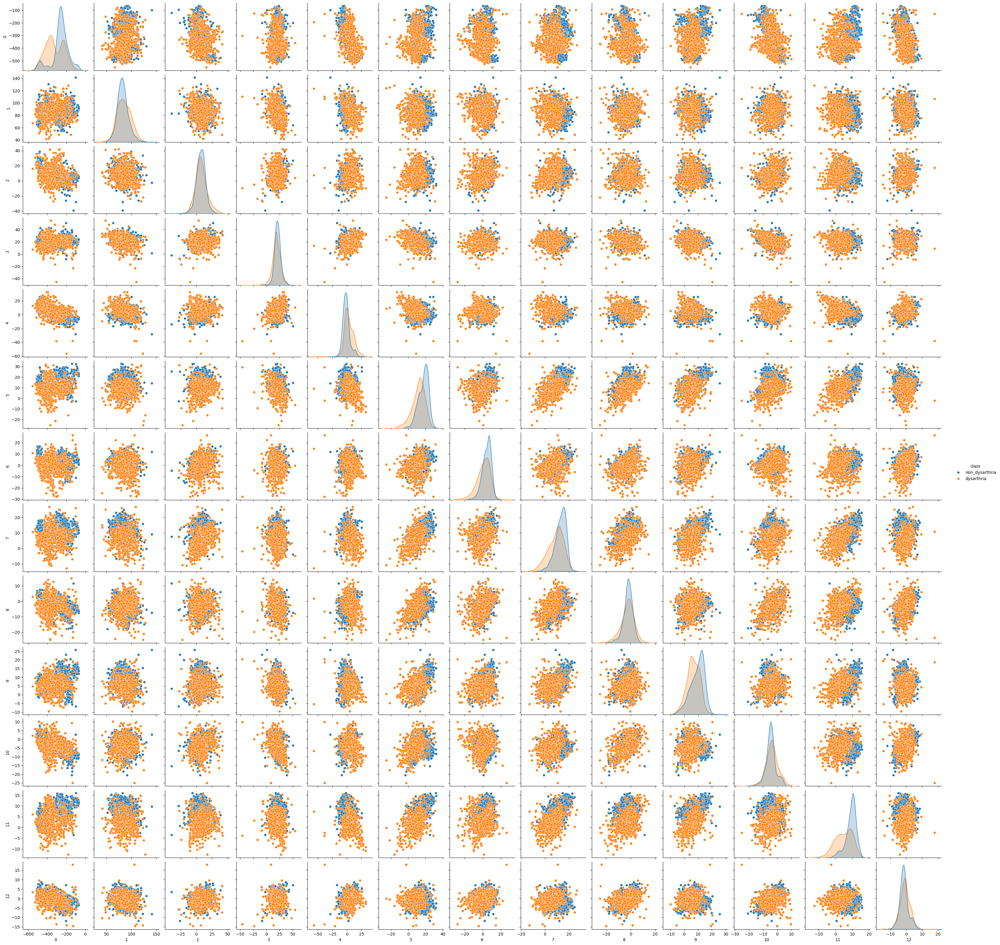

In [485]:
from seaborn import pairplot
pairplot(dataf, hue='class')
plt.show()

In [659]:
dataf

,0,1,2,3,4,5,6,7,8,9,...,31,32,33,34,35,36,37,38,Gender,class
0,-191.008789,73.621017,3.184799,20.472912,-1.684721,11.593274,-2.840228,10.140151,-5.058170,6.072175,...,2.535385,-0.082107,-1.176414,-2.194523,-2.288168,-1.874729,-1.261898,-3.769901,female,non_dysarthria
1,-271.245300,79.915596,2.773101,20.493851,-3.536856,17.838865,6.517058,13.832055,-0.352400,13.498947,...,2.690628,0.937090,3.071594,-0.862770,0.933697,-2.534059,-3.345884,-3.676381,female,non_dysarthria
2,-270.576904,77.244087,1.497219,22.059746,-6.765018,20.577847,4.576117,15.214016,0.240988,13.884055,...,3.053736,-1.053124,0.528598,-1.736316,1.311097,-3.152502,-3.590364,-4.800332,female,non_dysarthria
3,-171.391724,79.037689,-10.014421,12.387104,-8.374492,14.631797,-2.644143,9.358830,-1.412721,5.326794,...,-0.206468,-3.586313,1.866151,-3.975761,-1.630950,-3.262937,-1.371456,-3.688527,female,non_dysarthria
4,-249.714325,71.885529,6.370342,23.944828,1.590188,17.456963,1.798949,15.239297,-2.658756,9.321095,...,0.583398,-3.777833,0.520553,-0.831207,0.492535,-3.566734,-3.461297,-4.287586,female,non_dysarthria
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2594,-115.563316,60.495018,5.578748,10.266530,5.058779,9.558516,6.097095,0.047062,-2.413861,0.355399,...,-2.395934,-0.993733,-2.054480,-0.729671,-1.310017,-2.593180,-2.425096,-1.886978,male,dysarthria
2595,-204.545059,23.400490,11.006338,4.014516,1.571687,-0.960488,-4.373589,-1.901825,0.387100,0.474410,...,4.309974,5.252840,5.165896,4.209841,3.828583,2.627786,1.414264,1.117115,male,dysarthria
2596,-192.289261,29.310261,11.990232,10.889333,8.199698,8.148474,7.495165,7.488724,6.092186,4.929106,...,-0.742224,-0.885802,-0.018471,-0.730668,-2.258293,-1.899454,-1.871904,-2.194456,female,dysarthria
2597,-203.330063,21.375898,17.223364,16.572680,11.713296,10.040483,5.733617,6.822681,4.030591,2.926594,...,0.707889,0.012865,0.139960,-0.322793,0.260403,-0.318005,-0.538431,-0.184305,female,non_dysarthria


## Normalizing 

In [632]:
from sklearn.preprocessing import StandardScaler

# Extract the features (columns 0 to 127) for normalization
features_to_normalize = dataf.iloc[:, :-2]  # Exclude the last column (class)

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit and transform the features
normalized_features = scaler.fit_transform(features_to_normalize)

# Replace the original features with the normalized ones in the DataFrame
dataf.iloc[:, :-2] = normalized_features


In [633]:
dataf

,0,1,2,3,4,5,6,7,8,9,...,120,121,122,123,124,125,126,127,Gender,class
0,0.763503,0.046582,-0.613122,0.334944,-0.518357,-0.112503,-0.891332,0.135353,-0.735159,-0.112412,...,-0.104469,-0.100494,-0.071145,-0.326269,-0.129518,0.692616,-0.612636,-0.582785,female,non_dysarthria
1,-0.056132,0.293400,-0.662823,0.337508,-0.775254,0.671255,0.581358,0.709075,0.214381,1.292532,...,1.656363,0.195751,-1.434378,0.870126,1.850767,2.106815,-0.378522,-1.404913,female,non_dysarthria
2,-0.049305,0.188647,-0.816848,0.529249,-1.223011,1.014969,0.275884,0.923832,0.334116,1.365384,...,1.952093,0.684165,-1.335347,1.520168,1.701528,1.796948,-0.465448,-1.463023,female,non_dysarthria
3,0.963897,0.258976,-2.206542,-0.655152,-1.446250,0.268801,-0.860472,0.013936,0.000427,-0.253418,...,-0.105257,0.198787,0.066288,-0.176114,-0.036378,-0.267607,0.243801,-0.225316,female,non_dysarthria
4,0.163812,-0.021469,-0.228561,0.760075,-0.064116,0.623330,-0.161199,0.927761,-0.251001,0.502196,...,0.097000,-1.265835,-0.457145,-0.039596,0.876507,-0.474264,-0.309823,-0.722526,female,non_dysarthria
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2594,1.534198,-0.468105,-0.324123,-0.914813,0.416990,-0.367844,0.515262,-1.433114,-0.201585,-1.193871,...,-0.574321,0.119652,0.646332,-0.718536,-0.813628,0.025339,0.637928,1.624529,male,dysarthria
2595,0.625227,-1.922626,0.331100,-1.680363,-0.066682,-1.687872,-1.132659,-1.735971,0.363599,-1.171357,...,-0.595000,1.512637,1.071752,-0.724931,-0.915249,0.240356,0.886546,0.726114,male,dysarthria
2596,0.750423,-1.690897,0.449877,-0.838551,0.852646,-0.544790,0.735297,-0.276679,1.514784,-0.328650,...,0.112671,0.125351,0.839512,1.174507,0.347934,1.143631,0.335356,-0.464469,female,dysarthria
2597,0.637639,-2.002013,1.081625,-0.142634,1.339993,-0.307362,0.458057,-0.380182,1.098791,-0.707471,...,-0.469823,0.297167,0.841090,-1.065949,-1.516124,-0.241417,1.202136,0.623773,female,non_dysarthria


# 4. Perparing DataSet for Usage in models
* making the target varible Values binary
* Assigning features and Target
* Checking tha shapes
* splitting the into Train and Test


In [634]:
dataf.loc[dataf['class']=='non_dysarthria','class'] = 0.0
dataf.loc[dataf['class']=='dysarthria','class'] = 1.0

dataf['class'] = dataf['class'].astype(float)



dataf.loc[dataf['Gender']=='female','Gender'] = 0.0
dataf.loc[dataf['Gender']=='male','Gender'] = 1.0

dataf['Gender']= dataf['Gender'].astype(float)


X = dataf.iloc[:,:-1].values
y = dataf.iloc[:,-1]
X.shape, y.shape

((2599, 129), (2599,))

In [635]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)# changed test size and removed Startify
#X_train = X_train.reshape(-1,16,8,1)
#X_test = X_test.reshape(-1,16,8,1)
#X_train = X_train.reshape(-1, 129, 1, 1)# to use gender as feature in CNN
#X_test = X_test.reshape(-1, 129, 1, 1) 
print(X_train.size)
print("Xtrain shape:",X_train.shape)
print("Xtest shape:",X_test.shape)
print("ytrain shape:",y_train.shape)
print("ytest shape:",y_test.shape)



268191
Xtrain shape: (2079, 129)
Xtest shape: (520, 129)
ytrain shape: (2079,)
ytest shape: (520,)


# 1. XGB Model
* to use it do not reshape train shape

In [636]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import xgboost as xgb

In [299]:
# Create an XGBoost model
model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', use_label_encoder=False)


[0]	validation_0-logloss:0.52764	validation_0-error:0.11015	validation_1-logloss:0.58383	validation_1-error:0.25192


[1]	validation_0-logloss:0.41874	validation_0-error:0.07119	validation_1-logloss:0.51283	validation_1-error:0.22692
[2]	validation_0-logloss:0.34506	validation_0-error:0.05435	validation_1-logloss:0.46351	validation_1-error:0.22692
[3]	validation_0-logloss:0.29088	validation_0-error:0.04281	validation_1-logloss:0.42152	validation_1-error:0.20577
[4]	validation_0-logloss:0.24708	validation_0-error:0.03319	validation_1-logloss:0.38980	validation_1-error:0.19423


`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[5]	validation_0-logloss:0.21760	validation_0-error:0.02742	validation_1-logloss:0.36668	validation_1-error:0.17692
[6]	validation_0-logloss:0.19300	validation_0-error:0.02261	validation_1-logloss:0.34969	validation_1-error:0.18077
[7]	validation_0-logloss:0.16903	validation_0-error:0.01780	validation_1-logloss:0.33939	validation_1-error:0.16731
[8]	validation_0-logloss:0.15264	validation_0-error:0.01491	validation_1-logloss:0.32679	validation_1-error:0.16731
[9]	validation_0-logloss:0.13448	validation_0-error:0.00770	validation_1-logloss:0.31638	validation_1-error:0.16923
[10]	validation_0-logloss:0.12353	validation_0-error:0.00625	validation_1-logloss:0.30642	validation_1-error:0.16346
[11]	validation_0-logloss:0.10869	validation_0-error:0.00385	validation_1-logloss:0.30167	validation_1-error:0.16346
[12]	validation_0-logloss:0.10126	validation_0-error:0.00337	validation_1-logloss:0.29672	validation_1-error:0.15769
[13]	validation_0-logloss:0.09370	validation_0-error:0.00241	validati

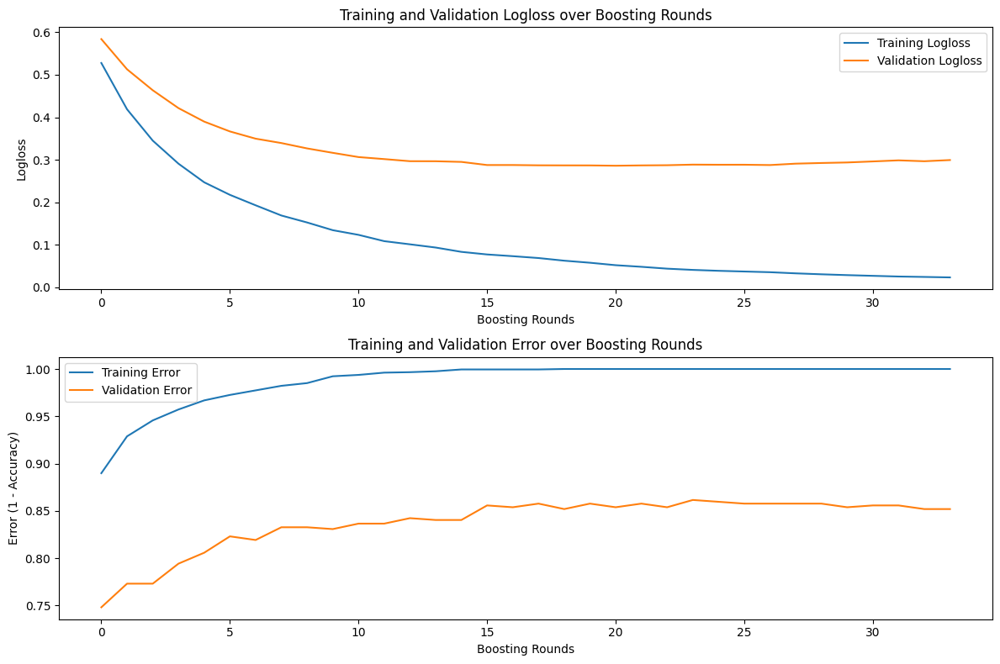

In [637]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

# Create an XGBoost classifier
xgb_classifier = XGBClassifier(n_estimators=100, eval_metric=["logloss", "error"])

# Train the model with eval_set for monitoring performance and implement early stopping
xgb_classifier.fit(
    X_train, 
    y_train, 
    eval_set=[(X_train,y_train),(X_test, y_test)],  # Use validation set for early stopping
    early_stopping_rounds=10,  # Stop if the metric doesn't improve for 50 rounds
    verbose=True)

# Make predictions on the test set
y_pred = xgb_classifier.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')

# Plot training and validation logloss
results = xgb_classifier.evals_result()
train_logloss = results['validation_0']['logloss']
val_logloss = results['validation_1']['logloss']

# Plot training and validation accuracy
train_error = results['validation_0']['error']
val_error = results['validation_1']['error']

plt.figure(figsize=(12, 8))

# Plot Logloss
plt.subplot(2, 1, 1)
plt.plot(train_logloss, label='Training Logloss')
plt.plot(val_logloss, label='Validation Logloss')
plt.xlabel('Boosting Rounds')
plt.ylabel('Logloss')
plt.title('Training and Validation Logloss over Boosting Rounds')
plt.legend()

# Plot Error (1 - Accuracy)
plt.subplot(2, 1, 2)
plt.plot([1 - acc for acc in train_error], label='Training Error')
plt.plot([1 - acc for acc in val_error], label='Validation Error')
plt.xlabel('Boosting Rounds')
plt.ylabel('Error (1 - Accuracy)')
plt.title('Training and Validation Error over Boosting Rounds')
plt.legend()

plt.tight_layout()
plt.show()


In [638]:
import numpy as np
from sklearn.model_selection import KFold, cross_val_score
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
k_folds = KFold(n_splits=10)

# Perform Cross-Validation
scores = cross_val_score(xgb_classifier, X, y, cv=k_folds, scoring='accuracy')

# Print the results
print("Cross-Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross-Validation Scores:  [0.97307692 0.95384615 0.95769231 0.95769231 0.96923077 0.98846154
 0.98846154 0.82307692 0.5        0.51351351]
Average CV Score:  0.8625051975051976
Number of CV Scores used in Average:  10


In [627]:
pred=xgb_classifier.predict(X_test)
print(accuracy_score(y_test,pred))


0.8557692307692307


In [647]:
# Define a set of parameters to search
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, KFold
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score
from xgboost import XGBClassifier
import shap
param_grid = {
    'n_estimators': [50, 60, 200],
    'max_depth': [3, 5, 7],
    # Add other parameters here
}

# Initialize the XGBClassifier
xgb = XGBClassifier(eval_metric='logloss')

# Setup the grid search
grid_search = GridSearchCV(xgb, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Perform grid search
grid_search.fit(X_train, y_train)

# Best parameters
print("Best parameters:", grid_search.best_params_)


Best parameters: {'max_depth': 7, 'n_estimators': 60}


In [648]:
# Train the model with the best parameters
best_params = grid_search.best_params_
xgb_classifier = XGBClassifier(**best_params, eval_metric=["logloss", "error"])
xgb_classifier.fit(
    X_train, y_train, 
    eval_set=[(X_train, y_train), (X_test, y_test)],
    early_stopping_rounds=10, 
    verbose=True
)
# Train the model with the best parameters
best_params = grid_search.best_params_
xgb_classifier = XGBClassifier(**best_params, eval_metric=["logloss", "error"])
xgb_classifier.fit(
    X_train, y_train, 
    eval_set=[(X_train, y_train), (X_test, y_test)],
    early_stopping_rounds=10, 
    verbose=True
)


[0]	validation_0-logloss:0.51247	validation_0-error:0.08706	validation_1-logloss:0.57697	validation_1-error:0.22500
[1]	validation_0-logloss:0.39764	validation_0-error:0.06013	validation_1-logloss:0.50978	validation_1-error:0.21923
[2]	validation_0-logloss:0.32501	validation_0-error:0.04281	validation_1-logloss:0.45523	validation_1-error:0.20962


`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[3]	validation_0-logloss:0.26664	validation_0-error:0.02790	validation_1-logloss:0.41993	validation_1-error:0.20385
[4]	validation_0-logloss:0.22476	validation_0-error:0.02068	validation_1-logloss:0.39117	validation_1-error:0.17692
[5]	validation_0-logloss:0.19343	validation_0-error:0.01876	validation_1-logloss:0.36320	validation_1-error:0.16923
[6]	validation_0-logloss:0.16818	validation_0-error:0.01684	validation_1-logloss:0.34648	validation_1-error:0.16538
[7]	validation_0-logloss:0.14543	validation_0-error:0.00818	validation_1-logloss:0.33652	validation_1-error:0.16538
[8]	validation_0-logloss:0.12901	validation_0-error:0.00577	validation_1-logloss:0.32321	validation_1-error:0.16346
[9]	validation_0-logloss:0.11631	validation_0-error:0.00385	validation_1-logloss:0.31317	validation_1-error:0.16154
[10]	validation_0-logloss:0.10261	validation_0-error:0.00144	validation_1-logloss:0.31290	validation_1-error:0.15769
[11]	validation_0-logloss:0.08835	validation_0-error:0.00048	validation

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=['logloss', 'error'],
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=7,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=60,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

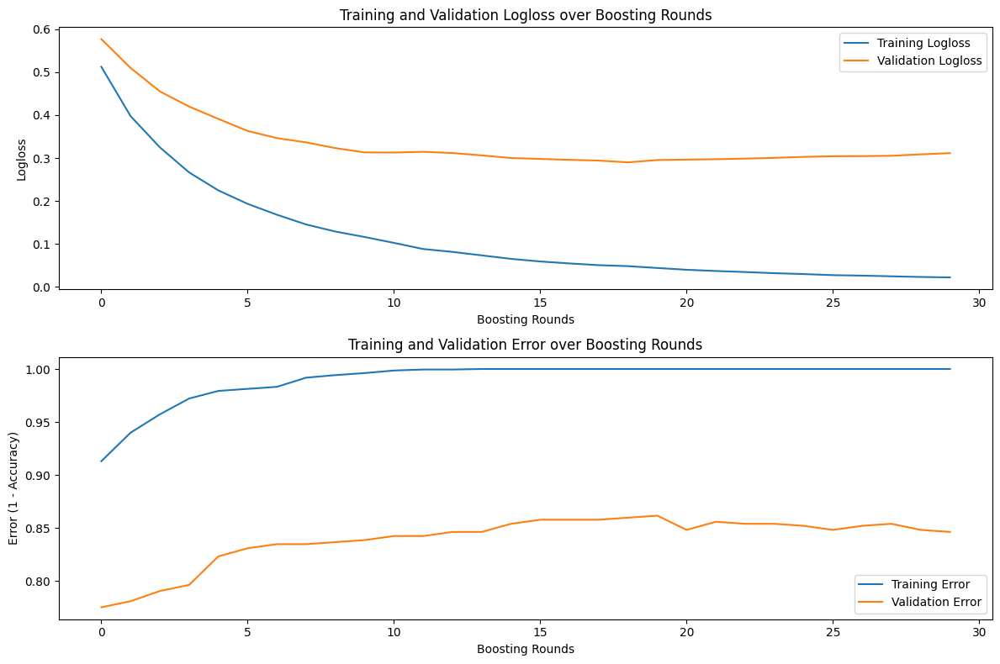

In [649]:
results = xgb_classifier.evals_result()
train_logloss = results['validation_0']['logloss']
val_logloss = results['validation_1']['logloss']

plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
plt.plot(train_logloss, label='Training Logloss')
plt.plot(val_logloss, label='Validation Logloss')
plt.xlabel('Boosting Rounds')
plt.ylabel('Logloss')
plt.title('Training and Validation Logloss over Boosting Rounds')
plt.legend()

plt.subplot(2, 1, 2)
plt.plot([1 - acc for acc in results['validation_0']['error']], label='Training Error')
plt.plot([1 - acc for acc in results['validation_1']['error']], label='Validation Error')
plt.xlabel('Boosting Rounds')
plt.ylabel('Error (1 - Accuracy)')
plt.title('Training and Validation Error over Boosting Rounds')
plt.legend()

plt.tight_layout()
plt.show()


In [650]:
k_folds = KFold(n_splits=10)
scores = cross_val_score(xgb_classifier, X, y, cv=k_folds, scoring='accuracy')
print("Cross-Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())


Cross-Validation Scores:  [0.96153846 0.95       0.95       0.95384615 0.96538462 0.98461538
 0.98461538 0.80384615 0.49230769 0.53667954]
Average CV Score:  0.8582833382833381


In [651]:
# Make predictions and evaluate
y_pred = xgb_classifier.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print("Confusion Matrix:\n", conf_matrix)
print("Classification Report:\n", class_report)


Accuracy: 0.8615384615384616
Confusion Matrix:
 [[222  43]
 [ 29 226]]
Classification Report:
               precision    recall  f1-score   support

         0.0       0.88      0.84      0.86       265
         1.0       0.84      0.89      0.86       255

    accuracy                           0.86       520
   macro avg       0.86      0.86      0.86       520
weighted avg       0.86      0.86      0.86       520



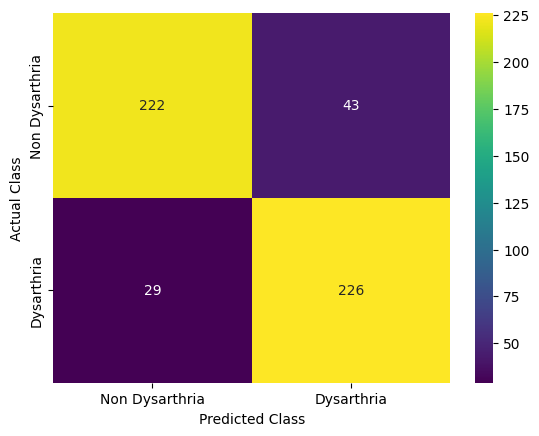

In [652]:
sns.heatmap(confusion_matrix(y_test, y_pred),cmap='viridis',annot=True,fmt='.3g',
            xticklabels=['Non Dysarthria','Dysarthria'],yticklabels=['Non Dysarthria','Dysarthria'])
plt.xlabel('Predicted Class')
plt.ylabel('Actual Class')
plt.show()

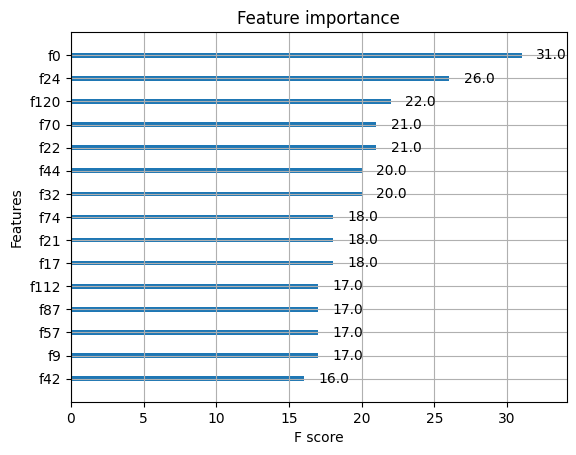

In [653]:
from xgboost import plot_importance

# Assuming 'xgb_classifier' is your trained XGBoost model
plot_importance(xgb_classifier, max_num_features=15)  # Shows top 10 features
plt.show()


In [473]:
# This will return a dictionary of features and their importance values
importance_dict = xgb_classifier.get_booster().get_score(importance_type='cover')
importance_dict


{'f0': 31.36507797241211,
 'f1': 14.247358322143555,
 'f2': 13.044540405273438,
 'f3': 18.377668380737305,
 'f4': 21.1811466217041,
 'f5': 9.09988021850586,
 'f6': 7.839978218078613,
 'f7': 9.422111511230469,
 'f8': 6.885148525238037,
 'f9': 13.672425270080566,
 'f10': 9.118490219116211,
 'f11': 39.1124267578125,
 'f12': 17.656156539916992,
 'f13': 23.531688690185547,
 'f14': 17.554109573364258,
 'f15': 71.7647476196289,
 'f16': 8.839033126831055,
 'f17': 26.718067169189453,
 'f18': 22.07724952697754,
 'f19': 13.224421501159668,
 'f20': 9.73159122467041,
 'f21': 29.837154388427734,
 'f22': 18.36330795288086,
 'f23': 14.191990852355957,
 'f24': 27.565584182739258,
 'f25': 5.568914413452148,
 'f26': 9.03612232208252,
 'f27': 13.699834823608398,
 'f28': 11.81615924835205,
 'f29': 15.597631454467773,
 'f30': 4.0778584480285645,
 'f31': 38.69648361206055,
 'f32': 29.32248878479004,
 'f33': 18.015975952148438,
 'f34': 11.795575141906738,
 'f35': 11.685317993164062,
 'f36': 5.357905864715576,

In [265]:
!pip install shap

   ---------------------------------------- 0.0/448.0 kB ? eta -:--:--
   --- ----------------------------------- 41.0/448.0 kB 991.0 kB/s eta 0:00:01
   ------- ------------------------------- 81.9/448.0 kB 919.0 kB/s eta 0:00:01
   ------------ --------------------------- 143.4/448.0 kB 1.2 MB/s eta 0:00:01
   --------------------- ------------------ 245.8/448.0 kB 1.4 MB/s eta 0:00:01
   ------------------------------------ --- 409.6/448.0 kB 1.8 MB/s eta 0:00:01
   ---------------------------------------- 448.0/448.0 kB 1.9 MB/s eta 0:00:00



[notice] A new release of pip is available: 23.3.1 -> 23.3.2
[notice] To update, run: python.exe -m pip install --upgrade pip


[18:28:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


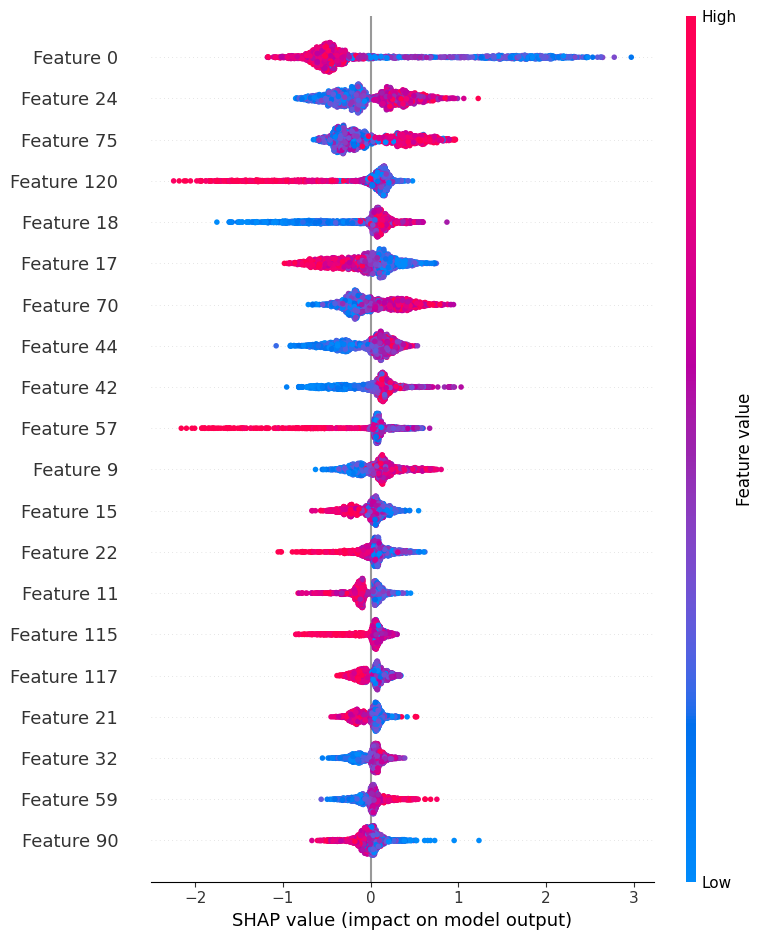

In [654]:
import shap

# Create a SHAP explainer
explainer = shap.TreeExplainer(xgb_classifier)
shap_values = explainer.shap_values(X_train)

# SHAP summary plot
shap.summary_plot(shap_values, X_train)


# CNN Model

In [319]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import InputLayer, Conv2D, MaxPooling2D, Dense, Flatten
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.layers import GlobalAveragePooling2D
from keras.layers import Dropout

In [30]:
from sklearn.model_selection import GridSearchCV
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

# Define a function to create your model
def create_model(filters, dense_size):
    model = Sequential([
        InputLayer(input_shape=(16, 8, 1)),
        Conv2D(filters=filters[0], kernel_size=(3, 3), activation='relu', padding="same"),
        MaxPooling2D(2, 2),
        Conv2D(filters=filters[1], kernel_size=(3, 3), activation='relu', padding="same"),
        MaxPooling2D(2, 2),
        Flatten(),
        Dense(dense_size, activation='relu'),
        Dense(1, activation='softmax')
    ])
    return model

# Wrap your Keras model using KerasClassifier
model = KerasClassifier(build_fn=create_model, epochs=10, batch_size=32, verbose=0)

# Define the hyperparameter grid
param_grid = {'filters': [(32, 64), (64, 128), (128, 256)],
              'dense_size': [32, 64, 128]
              # Add other hyperparameters as needed
              }

# Create GridSearchCV object
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5)
grid_result = grid_search.fit(X_train, y_train)

# Access best hyperparameters
best_params = grid_result.best_params_

# Access the best model
best_model = grid_result.best_estimator_.model


ModuleNotFoundError: No module named 'tensorflow.keras.wrappers'

In [332]:
X_train = X_train.values.astype('float32')
X_test = X_test.values.astype('float32')


AttributeError: 'numpy.ndarray' object has no attribute 'values'

In [459]:
from keras.models import Sequential
from keras.layers import InputLayer, Conv1D, MaxPooling1D, Flatten, Dense, GlobalAveragePooling1D

from keras.models import Sequential
from keras.layers import InputLayer, Conv2D, MaxPooling2D, Dropout, Flatten, Dense
"""
model = Sequential([
    InputLayer(input_shape=(129, 1)),
    Conv1D(filters=32, kernel_size=3, activation='relu', padding='same'),
    MaxPooling1D(2, padding='same'),
    Conv1D(filters=64, kernel_size=3, activation='relu', padding='same'),
    MaxPooling1D(2, padding='same'),
    GlobalAveragePooling1D(),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')  # Use when using gender as Feature
])

model.summary()
"""
"""
model = Sequential([
    InputLayer(input_shape=(16, 8, 1)),
    Conv2D(filters=32, kernel_size=(3, 3), activation='relu', padding = "same"),
    MaxPooling2D(2, 2),
    Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding = "same"),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])
model.summary()"""

from keras.models import Sequential
from keras.layers import InputLayer, Conv2D, MaxPooling2D, Dropout, Flatten, Dense
"""
model = Sequential([#paper model
    InputLayer(input_shape=(16, 8, 1)),
    Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same'),
    MaxPooling2D(2, 2),
    Conv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dropout(0.1),
    Dense(1024, activation='relu'),
    Dense(1, activation='sigmoid')
])

model.summary()"""

#Build the 1D CNN model
model = Sequential([
    Conv1D(64, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], 1)),
    MaxPooling1D(pool_size=2),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(1, activation='sigmoid')  # Sigmoid for binary classification
])
model.summary()



Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_11 (Conv1D)          (None, 38, 64)            256       
                                                                 
 max_pooling1d_11 (MaxPooli  (None, 19, 64)            0         
 ng1D)                                                           
                                                                 
 flatten_13 (Flatten)        (None, 1216)              0         
                                                                 
 dense_34 (Dense)            (None, 128)               155776    
                                                                 
 dense_35 (Dense)            (None, 1)                 129       
                                                                 
Total params: 156161 (610.00 KB)
Trainable params: 156161 (610.00 KB)
Non-trainable params: 0 (0.00 Byte)
_____________

In [321]:
model = Sequential([
    InputLayer(input_shape=(129, 1, 1)),
    Conv2D(filters=32, kernel_size=(3, 3), activation='relu', padding="same"),
    MaxPooling2D(1, ),
    Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding="same"),
    Flatten(),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])
model.summary()



Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 129, 1, 32)        320       
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 129, 1, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_3 (Conv2D)           (None, 129, 1, 64)        18496     
                                                                 
 flatten_7 (Flatten)         (None, 8256)              0         
                                                                 
 dense_22 (Dense)            (None, 32)                264224    
                                                                 
 dense_23 (Dense)            (None, 1)                 33        
                                                      

In [460]:
from keras.optimizers import Adam
from keras.losses import BinaryCrossentropy

# Compile the model for binary classificatio model.compile(optimizer=Adam(learning_rate=0.0005),loss=BinaryCrossentropy(),metrics=['accuracy'])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [461]:
model_name = "model.h5"
checkpoint = ModelCheckpoint(model_name,
                            monitor="val_loss",
                            mode="min",
                            save_best_only = True,
                            verbose=1)

earlystopping = EarlyStopping(monitor='val_loss',min_delta = 0, patience = 5, verbose = 1, restore_best_weights=True)

# 1. ModelCheckpoint:
* Monitor: It monitors a specified metric during training. In this case, it's monitoring the validation loss ("val_loss").

* Mode: It specifies whether to minimize ("min") or maximize ("max") the monitored metric. Here, it's set to minimize.

* save_best_only: If set to True, it saves only the best model (based on the monitored metric). This is useful to ensure that you keep the model with the best performance.

* verbose: It controls the verbosity of the output during training. When set to 1, it provides some information about the checkpointing process.

**This callback is useful when you want to save the model with the best validation performance to a file. If the validation loss improves compared to the previous best, it saves the model.**

# 2.EarlyStopping:

* Monitor: It monitors a specified metric during training, similar to ModelCheckpoint. Here, it's monitoring the validation loss ('val_loss').

* min_delta: It represents the minimum change in the monitored metric to qualify as an improvement. If the change is smaller than this value, it's considered no improvement.

* patience: It represents the number of epochs with no improvement after which training will be stopped. In this case, if there is no improvement in validation loss for 5 consecutive epochs, training will stop.

* restore_best_weights: If set to True, the model weights are restored to the best weights observed during training. This is useful to avoid overfitting and keep the model with the best generalization performance.

* verbose: It controls the verbosity of the output during training. When set to 1, it provides some information about the early stopping process.

**This callback is helpful for preventing overfitting. If the validation loss does not improve for a certain number of consecutive epochs, training is stopped early to avoid overfitting and unnecessary computation.**
 * By using these callbacks, you can save the best model and stop training early if there is no improvement in the validation loss, which is a common practice in training deep learning models.







In [462]:
history = model.fit(X_train, y_train, epochs=30,batch_size=50, validation_data=(X_test,y_test), callbacks=[checkpoint,earlystopping])

Epoch 1/30
25/32 [======================>.......] - ETA: 0s - loss: 1.3565 - accuracy: 0.6488
Epoch 1: val_loss improved from inf to 0.57309, saving model to model.h5
32/32 [==============================] - 1s 12ms/step - loss: 1.1864 - accuracy: 0.6692 - val_loss: 0.5731 - val_accuracy: 0.7175
Epoch 2/30
24/32 [=====================>........] - ETA: 0s - loss: 0.4237 - accuracy: 0.7917
Epoch 2: val_loss improved from 0.57309 to 0.43918, saving model to model.h5


You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


32/32 [==============================] - 0s 6ms/step - loss: 0.4089 - accuracy: 0.8036 - val_loss: 0.4392 - val_accuracy: 0.7875
Epoch 3/30
30/32 [===========================>..] - ETA: 0s - loss: 0.3338 - accuracy: 0.8627
Epoch 3: val_loss improved from 0.43918 to 0.33730, saving model to model.h5
32/32 [==============================] - 0s 10ms/step - loss: 0.3289 - accuracy: 0.8668 - val_loss: 0.3373 - val_accuracy: 0.8575
Epoch 4/30
17/32 [==============>...............] - ETA: 0s - loss: 0.2633 - accuracy: 0.9035
Epoch 4: val_loss did not improve from 0.33730
32/32 [==============================] - 0s 5ms/step - loss: 0.2713 - accuracy: 0.8999 - val_loss: 0.3548 - val_accuracy: 0.8525
Epoch 5/30
29/32 [==========================>...] - ETA: 0s - loss: 0.2829 - accuracy: 0.8745
Epoch 5: val_loss improved from 0.33730 to 0.29297, saving model to model.h5
32/32 [==============================] - 0s 5ms/step - loss: 0.2788 - accuracy: 0.8793 - val_loss: 0.2930 - val_accuracy: 0.8725


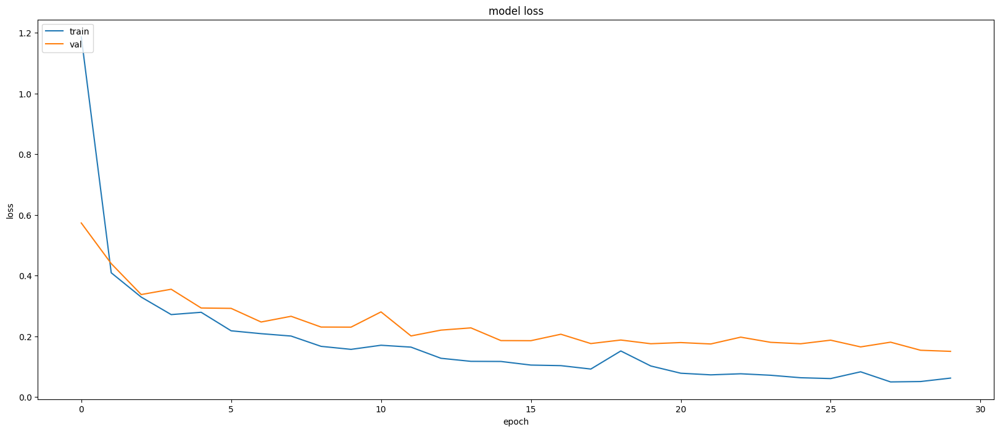

In [463]:
plt.figure(figsize=(20,8))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

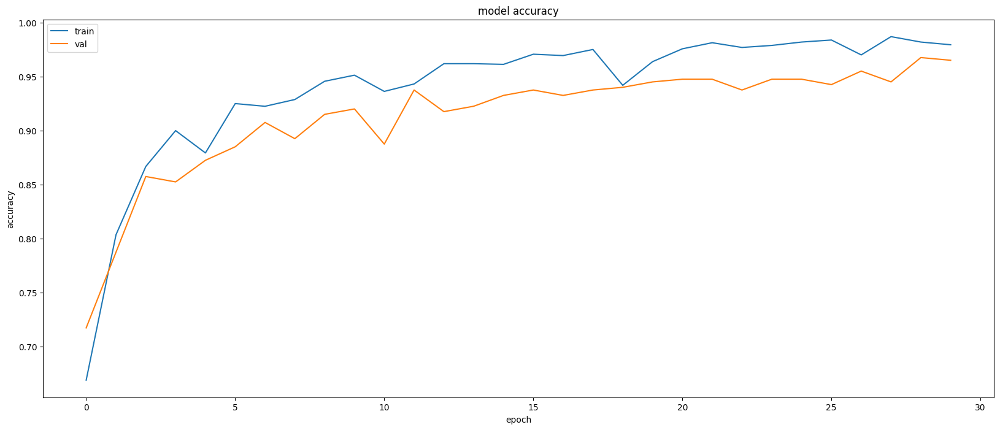

In [464]:
plt.figure(figsize=(20,8))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [465]:
y_pred = model.predict(X_test)

13/13 [==============================] - 0s 1ms/step


13/13 [==============================] - 0s 3ms/step


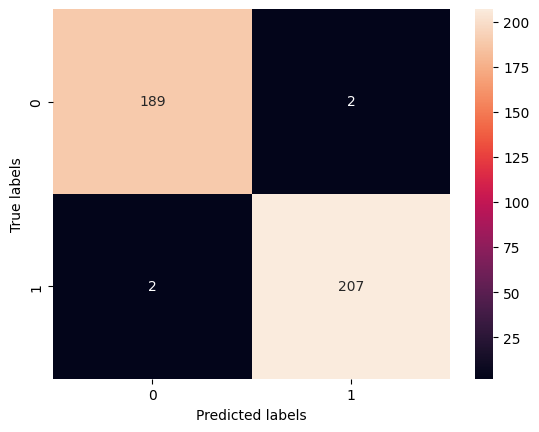

              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99       191
         1.0       0.99      0.99      0.99       209

    accuracy                           0.99       400
   macro avg       0.99      0.99      0.99       400
weighted avg       0.99      0.99      0.99       400



In [128]:
# Make predictions on the test set
y_pred = model.predict(X_test)
y_pred_binary = (y_pred > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_binary)

# Plot the confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

# Print a classification report for more details
print(classification_report(y_test, y_pred_binary))

15/15 [==============================] - 0s 2ms/step


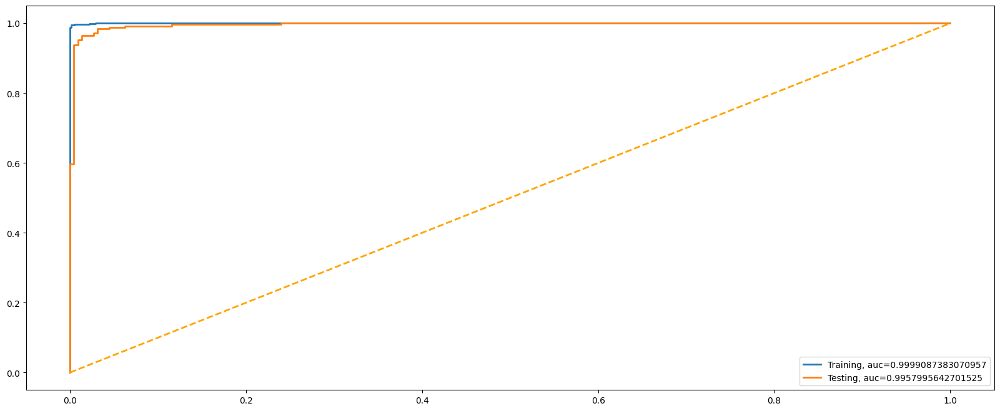

In [411]:
# Plot ROC curve
plt.figure(figsize=(20, 8))

# Plot training ROC curve
y_train_pred = model.predict(X_train)
fpr_train, tpr_train, _ = roc_curve(y_train, y_train_pred)
auc_train = roc_auc_score(y_train, y_train_pred)
plt.plot(fpr_train, tpr_train, label="Training, auc=" + str(auc_train), lw=2)

# Plot test ROC curve
y_test_pred = model.predict(X_test)
fpr_test, tpr_test, _ = roc_curve(y_test, y_test_pred)
auc_test = roc_auc_score(y_test, y_pred)
plt.plot(fpr_test, tpr_test, label="Testing, auc=" + str(auc_test), lw=2)

# Plot random chance
plt.plot([0, 1], [0, 1], color="orange", lw=2, linestyle="--")

plt.legend(loc=4)
plt.show()

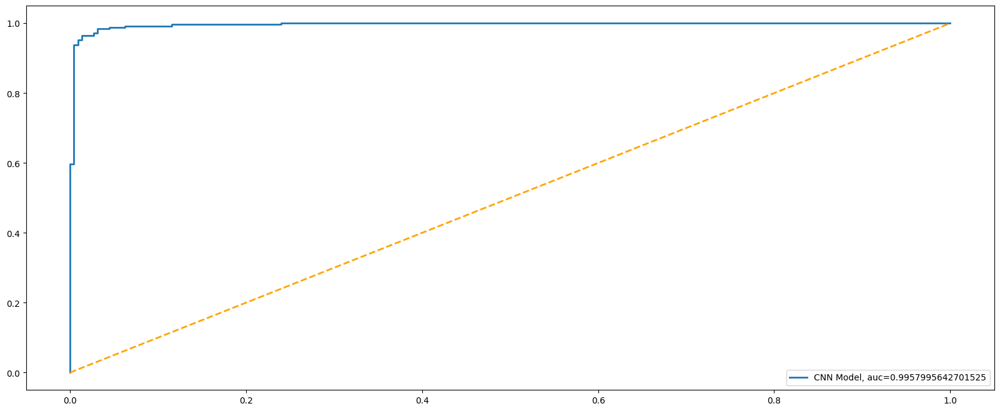

In [412]:
plt.figure(figsize=(20,8))
fpr, tpr, _ = roc_curve(y_test,  y_pred)
auc = roc_auc_score(y_test, y_pred)
plt.plot(fpr,tpr,label="CNN Model, auc="+str(auc),lw=2)
plt.plot([0, 1], [0, 1], color="orange", lw=2, linestyle="--")
plt.legend(loc=4)
plt.show()

In [466]:
y_pred

array([[9.99976635e-01],
       [9.99407411e-01],
       [1.04000990e-03],
       [9.71995056e-01],
       [9.99929786e-01],
       [9.88757133e-01],
       [7.27880418e-01],
       [7.98789319e-03],
       [5.81331411e-03],
       [8.50799959e-03],
       [9.99957919e-01],
       [9.94248927e-01],
       [3.16067273e-03],
       [3.86649808e-05],
       [9.99533057e-01],
       [9.97138858e-01],
       [6.70690686e-02],
       [9.99091566e-01],
       [9.98416543e-01],
       [9.99989033e-01],
       [5.51726362e-06],
       [9.99929190e-01],
       [3.01091379e-04],
       [1.12044986e-03],
       [9.97425497e-01],
       [8.58948350e-01],
       [9.56344783e-01],
       [5.97949624e-02],
       [9.99975681e-01],
       [9.99999940e-01],
       [9.99983013e-01],
       [5.72766876e-03],
       [3.79611164e-01],
       [9.99408841e-01],
       [9.99801040e-01],
       [3.80854239e-03],
       [2.49771718e-02],
       [9.97760117e-01],
       [2.05603763e-02],
       [9.30850278e-04],


In [467]:
y_pred[y_pred>=0.5] = 1
y_pred[y_pred<0.5] = 0

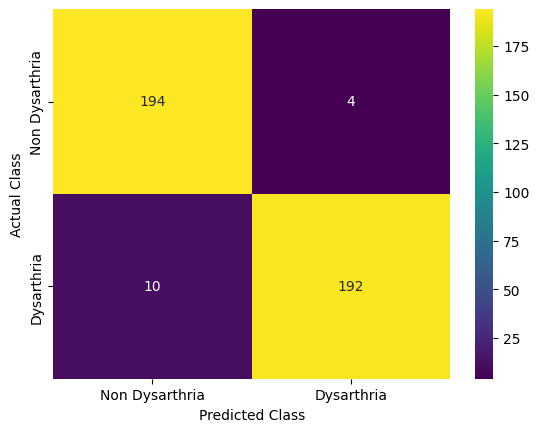

In [468]:
sns.heatmap(confusion_matrix(y_test, y_pred),cmap='viridis',annot=True,fmt='.3g',
            xticklabels=['Non Dysarthria','Dysarthria'],yticklabels=['Non Dysarthria','Dysarthria'])
plt.xlabel('Predicted Class')
plt.ylabel('Actual Class')
plt.show()

In [469]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       0.95      0.98      0.97       198
         1.0       0.98      0.95      0.96       202

    accuracy                           0.96       400
   macro avg       0.97      0.97      0.96       400
weighted avg       0.97      0.96      0.96       400



In [470]:
print("Recall Score of the Model: ",recall_score(y_test,y_pred))

Recall Score of the Model:  0.9504950495049505


In [471]:
from sklearn.metrics import accuracy_score,recall_score,roc_auc_score,roc_curve


In [472]:
print("accuracy",accuracy_score(y_test,y_pred))

accuracy 0.965
